In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('seattle-weather.csv')

In [5]:
df.weather.unique()

array(['drizzle', 'rain', 'sun', 'snow', 'fog'], dtype=object)

In [396]:
df.head()

,date,precipitation,temp_max,temp_min,wind,weather
0,2012-01-01,0.0,12.8,5.0,4.7,drizzle
1,2012-01-02,10.9,10.6,2.8,4.5,rain
2,2012-01-03,0.8,11.7,7.2,2.3,rain
3,2012-01-04,20.3,12.2,5.6,4.7,rain
4,2012-01-05,1.3,8.9,2.8,6.1,rain


In [344]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1461 entries, 0 to 1460
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           1461 non-null   object 
 1   precipitation  1461 non-null   float64
 2   temp_max       1461 non-null   float64
 3   temp_min       1461 non-null   float64
 4   wind           1461 non-null   float64
 5   weather        1461 non-null   object 
dtypes: float64(4), object(2)
memory usage: 68.6+ KB


In [345]:
df.describe()

,precipitation,temp_max,temp_min,wind
count,1461.000000,1461.000000,1461.000000,1461.000000
mean,3.029432,16.439083,8.234771,3.241136
std,6.680194,7.349758,5.023004,1.437825
min,0.000000,-1.600000,-7.100000,0.400000
25%,0.000000,10.600000,4.400000,2.200000
50%,0.000000,15.600000,8.300000,3.000000
75%,2.800000,22.200000,12.200000,4.000000
max,55.900000,35.600000,18.300000,9.500000


In [346]:
df.isnull().sum()

date             0
precipitation    0
temp_max         0
temp_min         0
wind             0
weather          0
dtype: int64

In [347]:
df.duplicated().sum()

0

<BarContainer object of 5 artists>

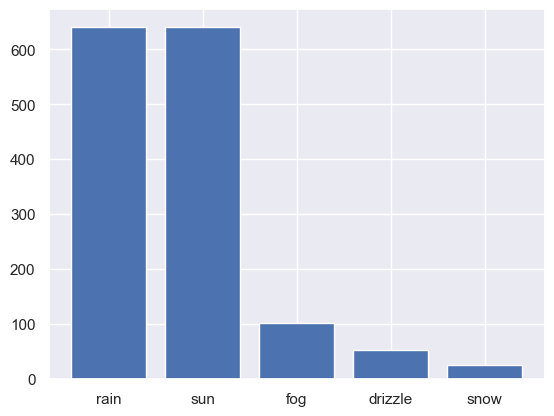

In [348]:
dis=df['weather'].value_counts()
plt.bar(dis.index,dis.values)

In [349]:
df.dtypes

date              object
precipitation    float64
temp_max         float64
temp_min         float64
wind             float64
weather           object
dtype: object

In [397]:
df['date']


0       2012-01-01
1       2012-01-02
2       2012-01-03
3       2012-01-04
4       2012-01-05
           ...    
1456    2015-12-27
1457    2015-12-28
1458    2015-12-29
1459    2015-12-30
1460    2015-12-31
Name: date, Length: 1461, dtype: object

In [398]:
df['date']=pd.to_datetime(df['date'])


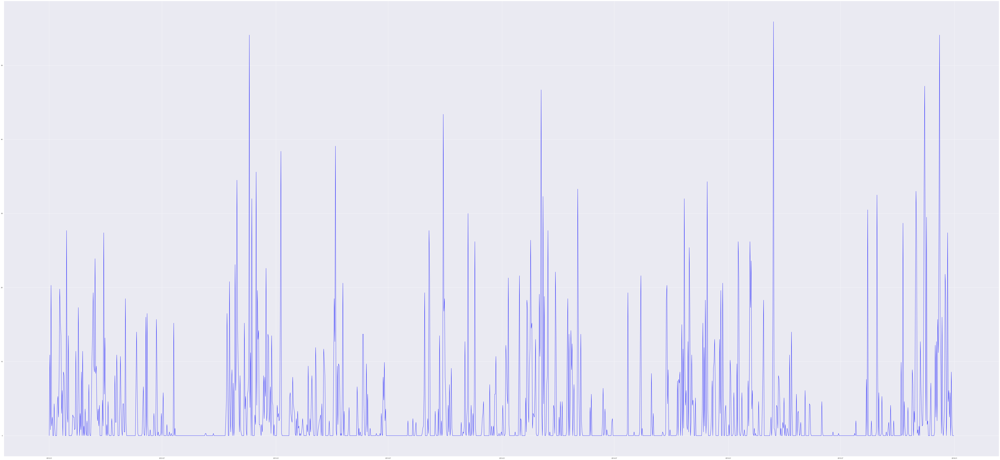

In [330]:
x=df['date']
y=df['precipitation']

plt.figure(figsize=(130,60))
plt.plot(x,y,color='blue')

plt.show()

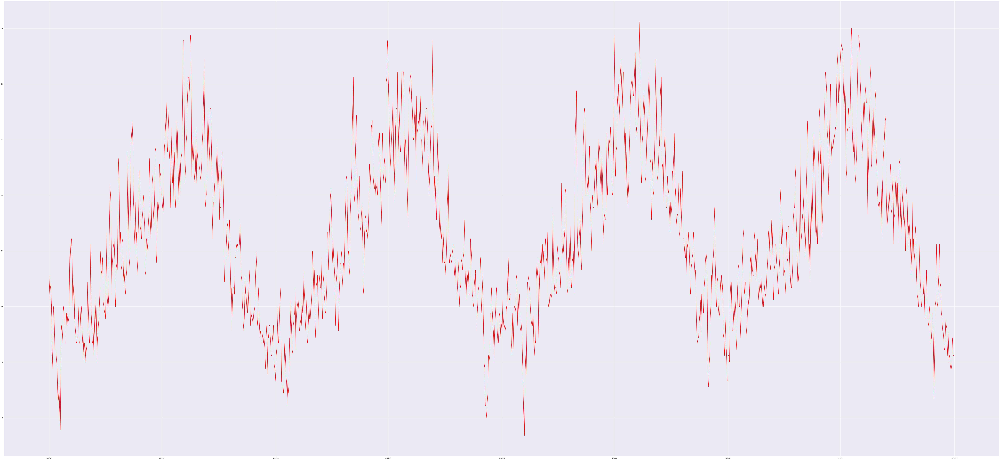

In [266]:
x=df['date']
y=df['temp_max']

plt.figure(figsize=(130,60))
plt.plot(x,y,color='red')

plt.show()


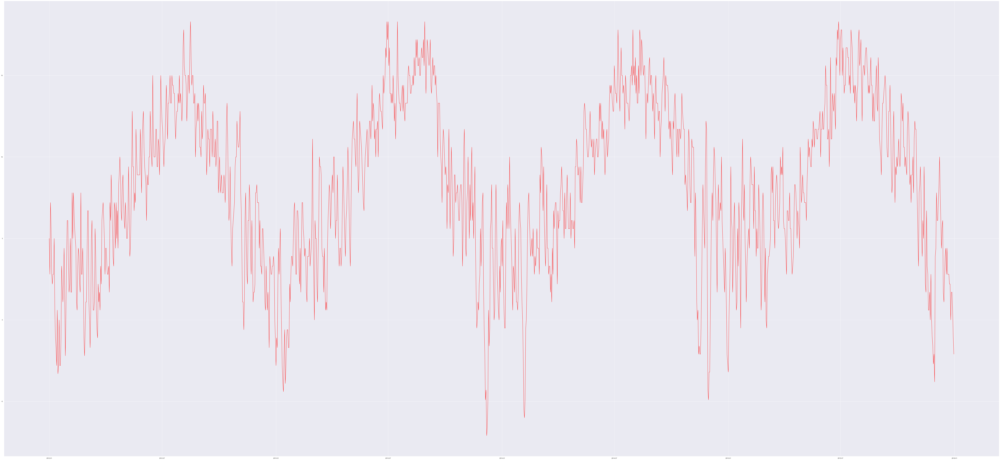

In [267]:
x=df['date']
y=df['temp_min']

plt.figure(figsize=(130,60))
plt.plot(x,y,color='red')

plt.show()

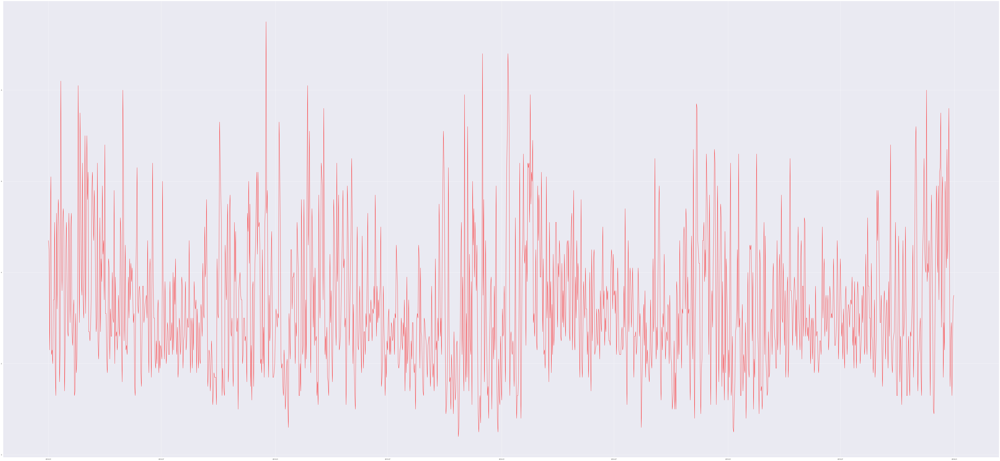

In [268]:
x=df['date']
y=df['wind']

plt.figure(figsize=(130,60))
plt.plot(x,y,color='red')

plt.show()

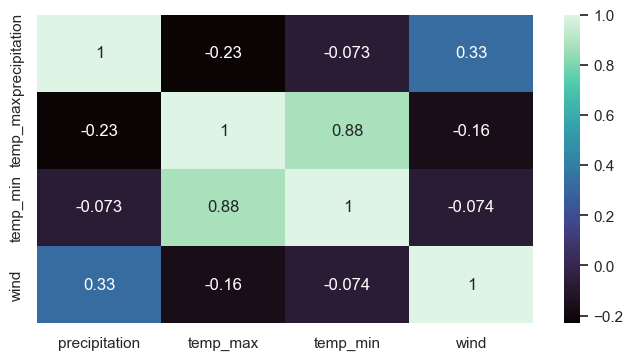

In [269]:
cor=df.corr()
plt.figure(figsize=(8,4))
sns.heatmap(cor,annot=True,cmap='mako')
plt.show()

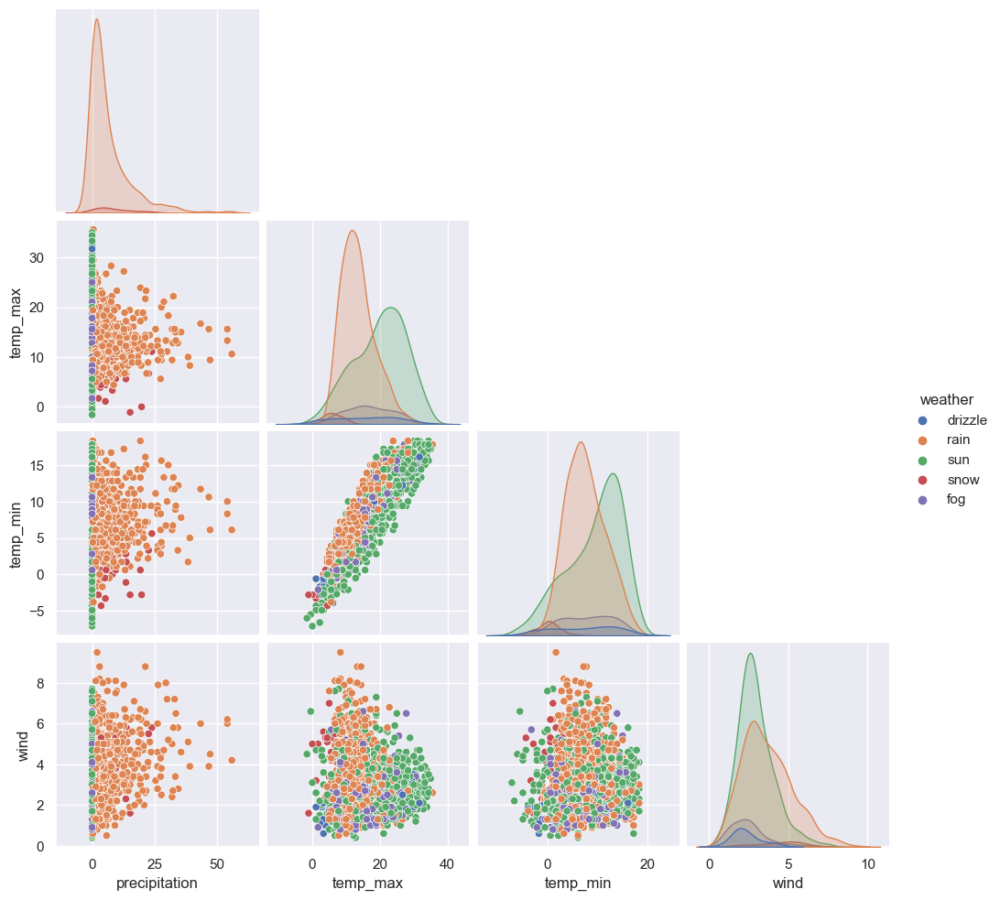

In [270]:
sns.pairplot(df, corner=True,hue='weather')

In [399]:
from sklearn.preprocessing import LabelEncoder
encoder=LabelEncoder()
weather_enc=encoder.fit_transform(df['weather'])
print(weather_enc)


[0 2 2 ... 1 4 4]


In [400]:
category_mapping = dict(zip(encoder.classes_, encoder.transform(encoder.classes_)))

# Print the mapping
print(category_mapping)

{'drizzle': 0, 'fog': 1, 'rain': 2, 'snow': 3, 'sun': 4}


In [401]:
df['weather_enc'] = weather_enc

In [402]:
#data day year month extraction
df['Day']=df['date'].dt.day
df['Month']=df['date'].dt.month
df['Year']=df['date'].dt.year
df.drop('date',axis=1,inplace=True)

In [403]:
df.drop(axis=1,columns='weather',inplace=True)

In [404]:
df

,precipitation,temp_max,temp_min,wind,weather_enc,Day,Month,Year
0,0.0,12.8,5.0,4.7,0,1,1,2012
1,10.9,10.6,2.8,4.5,2,2,1,2012
2,0.8,11.7,7.2,2.3,2,3,1,2012
3,20.3,12.2,5.6,4.7,2,4,1,2012
4,1.3,8.9,2.8,6.1,2,5,1,2012
...,...,...,...,...,...,...,...,...
1456,8.6,4.4,1.7,2.9,2,27,12,2015
1457,1.5,5.0,1.7,1.3,2,28,12,2015
1458,0.0,7.2,0.6,2.6,1,29,12,2015
1459,0.0,5.6,-1.0,3.4,4,30,12,2015


In [386]:
df['Year'].value_counts()


2012    366
2013    365
2014    365
2015    365
Name: Year, dtype: int64

weather weather_enc

* drizzle ->  0
* fog     ->  1
* rain    ->  2
* snow    ->  3
* sun     ->  4

In [278]:
df.dtypes

precipitation    float64
temp_max         float64
temp_min         float64
wind             float64
weather           object
Day                int64
Month              int64
Year               int64
weather_enc        int64
dtype: object

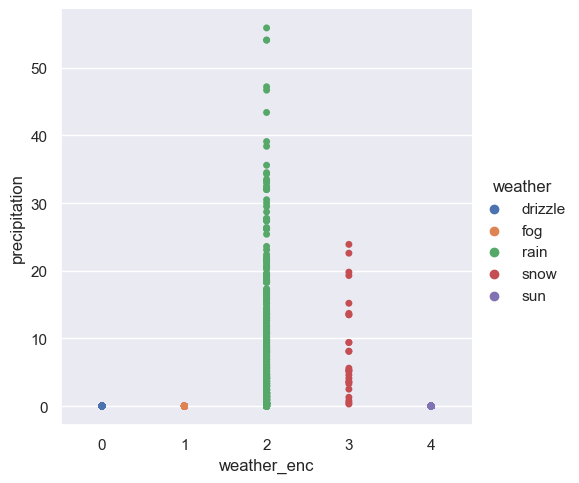

In [279]:
import seaborn as sns
sns.set_theme(style="darkgrid")
sns.catplot(df,x='weather_enc',y='precipitation' ,hue='weather',jitter=False)

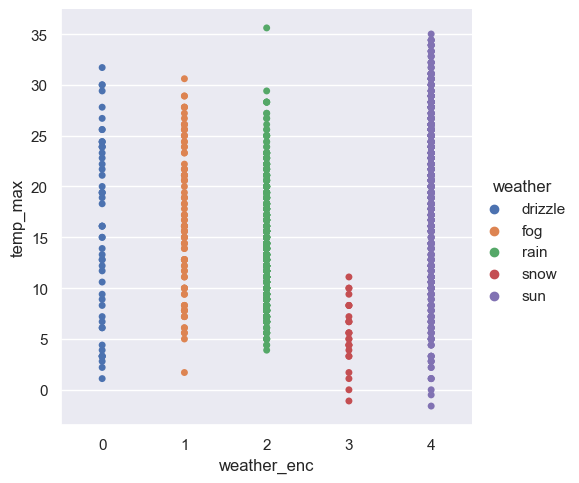

In [280]:
sns.catplot(df,x='weather_enc',y='temp_max',hue='weather' ,jitter=False)


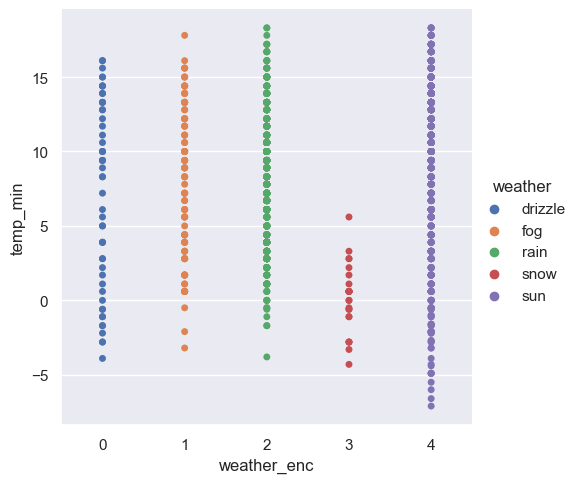

In [281]:
sns.catplot(df,x='weather_enc',y='temp_min',hue='weather' ,jitter=False)

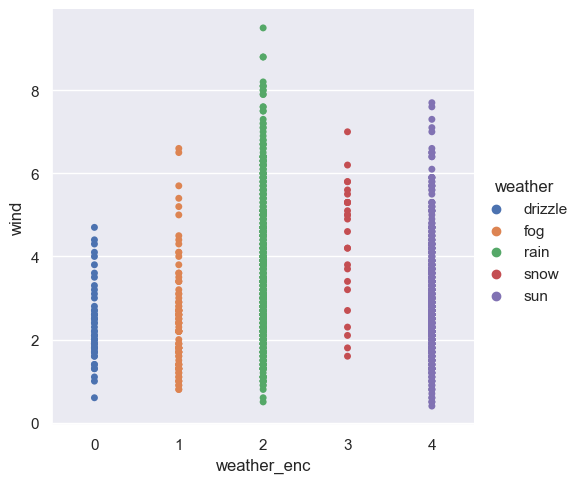

In [282]:
sns.catplot(df,x='weather_enc',y='wind',hue='weather' ,jitter=False)

In [305]:
df.dtypes

precipitation    float64
temp_max         float64
temp_min         float64
wind             float64
Day                int64
Month              int64
Year               int64
weather_enc        int64
dtype: object

In [306]:
df.columns

Index(['precipitation', 'temp_max', 'temp_min', 'wind', 'Day', 'Month', 'Year',
       'weather_enc'],
      dtype='object')

<Axes: xlabel='weather_enc', ylabel='Count'>

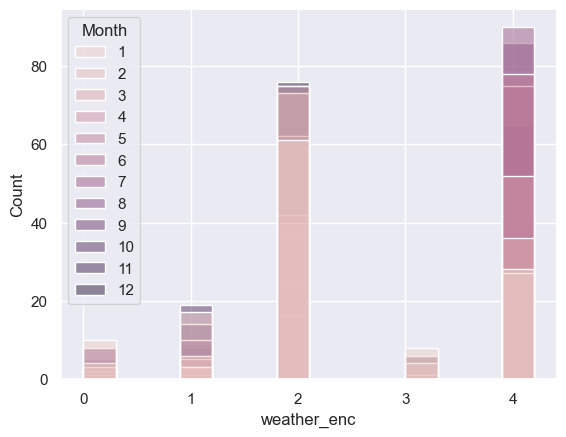

In [248]:
sns.histplot(x="weather_enc",hue="Month",,data=df,binwidth=0.3)

In [249]:
df['Month']

0        1
1        1
2        1
3        1
4        1
        ..
1456    12
1457    12
1458    12
1459    12
1460    12
Name: Month, Length: 1461, dtype: int64

In [405]:
import pandas as pd

# Assuming you have a DataFrame 'df' with a column 'month_int' containing integers from 1 to 12
df['Month'] = df['Month'].map({1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 6: 'June', 7: 'July', 8: 'August', 9: 'September', 10: 'October', 11: 'November', 12: 'December'})

# Now, 'month' column contains the month names


In [406]:
df

,precipitation,temp_max,temp_min,wind,weather_enc,Day,Month,Year
0,0.0,12.8,5.0,4.7,0,1,January,2012
1,10.9,10.6,2.8,4.5,2,2,January,2012
2,0.8,11.7,7.2,2.3,2,3,January,2012
3,20.3,12.2,5.6,4.7,2,4,January,2012
4,1.3,8.9,2.8,6.1,2,5,January,2012
...,...,...,...,...,...,...,...,...
1456,8.6,4.4,1.7,2.9,2,27,December,2015
1457,1.5,5.0,1.7,1.3,2,28,December,2015
1458,0.0,7.2,0.6,2.6,1,29,December,2015
1459,0.0,5.6,-1.0,3.4,4,30,December,2015


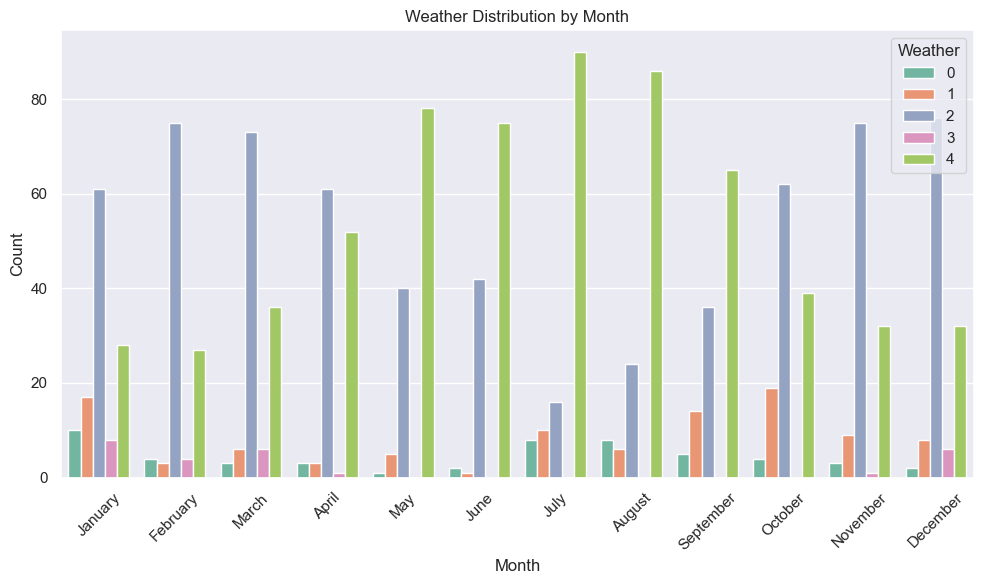

In [407]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a bar plot or count plot
plt.figure(figsize=(10, 6))  # Set the figure size
sns.countplot(x='Month', hue='weather_enc', data=df, palette='Set2')

# Customize the plot
plt.title('Weather Distribution by Month')
plt.xlabel('Month')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Show the plot
plt.legend(title='Weather', loc='upper right')  # Add a legend
plt.tight_layout()  # Ensure the labels and ticks fit within the figure
plt.show()


* drizzle ->  0
* fog     ->  1
* rain    ->  2
* snow    ->  3
* sun     ->  4

weather in change according to month

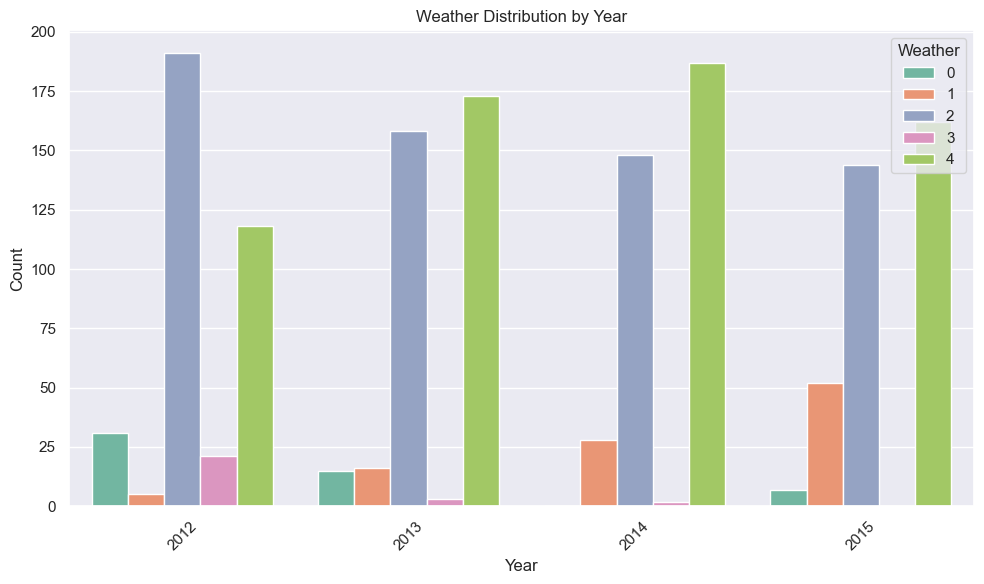

In [408]:
# Create a bar plot or count plot
plt.figure(figsize=(10, 6))  # Set the figure size
sns.countplot(x='Year', hue='weather_enc', data=df, palette='Set2')

# Customize the plot
plt.title('Weather Distribution by Year')
plt.xlabel('Year')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Show the plot
plt.legend(title='Weather', loc='upper right')  # Add a legend
plt.tight_layout()  # Ensure the labels and ticks fit within the figure
plt.show()

* drizzle ->  0
* fog     ->  1
* rain    ->  2
* snow    ->  3
* sun     ->  4

there is no such correlation in weather and year

In [409]:
df=df.drop(columns='Year')

,precipitation,temp_max,temp_min,wind,weather_enc,Day,Month
0,0.0,12.8,5.0,4.7,0,1,1
1,10.9,10.6,2.8,4.5,2,2,1
2,0.8,11.7,7.2,2.3,2,3,1
3,20.3,12.2,5.6,4.7,2,4,1
4,1.3,8.9,2.8,6.1,2,5,1
...,...,...,...,...,...,...,...
1456,8.6,4.4,1.7,2.9,2,27,12
1457,1.5,5.0,1.7,1.3,2,28,12
1458,0.0,7.2,0.6,2.6,1,29,12
1459,0.0,5.6,-1.0,3.4,4,30,12


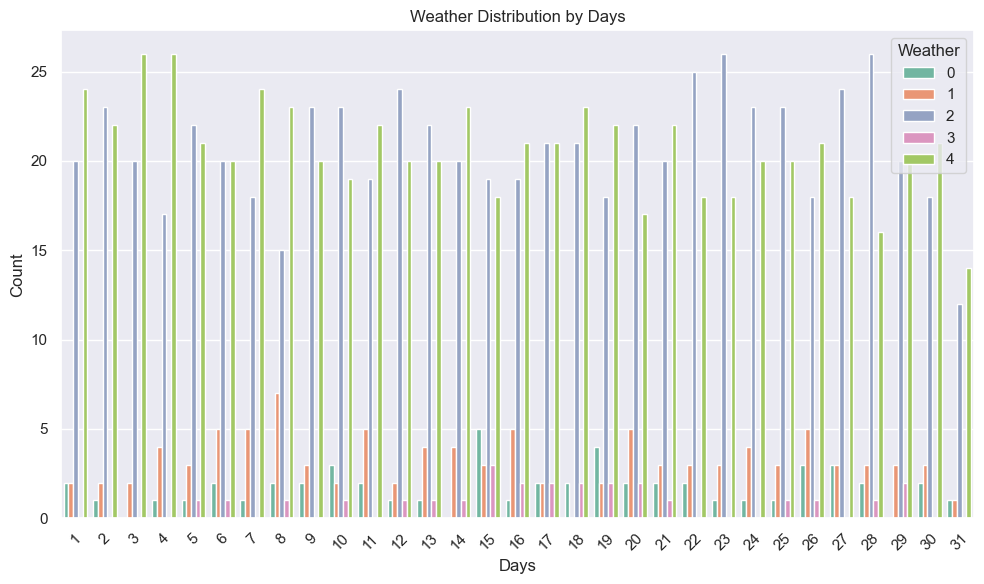

In [421]:
# Create a bar plot or count plot
plt.figure(figsize=(10, 6))  # Set the figure size
sns.countplot(x='Day', hue='weather_enc', data=df, palette='Set2')

# Customize the plot
plt.title('Weather Distribution by Days')
plt.xlabel('Days')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Show the plot
plt.legend(title='Weather', loc='upper right')  # Add a legend
plt.tight_layout()  # Ensure the labels and ticks fit within the figure
plt.show()

In [6]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


In [7]:
# Replace 'your_dataset.csv' with the actual file name or path
df = pd.read_csv('seattle-weather.csv')


In [9]:
X = df[['precipitation', 'temp_max', 'temp_min', 'wind']]
y = df['weather']  # Replace 'weather_condition' with your actual target column name


In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [11]:
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)


DecisionTreeClassifier()

In [12]:
y_pred = clf.predict(X_test)


In [13]:
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{class_report}")


Accuracy: 0.7337883959044369
Confusion Matrix:
[[  1   1   0   0   7]
 [  2   4   2   0  17]
 [  1   0 107   5   7]
 [  0   0   5   3   0]
 [ 11  16   4   0 100]]
Classification Report:
              precision    recall  f1-score   support

     drizzle       0.07      0.11      0.08         9
         fog       0.19      0.16      0.17        25
        rain       0.91      0.89      0.90       120
        snow       0.38      0.38      0.38         8
         sun       0.76      0.76      0.76       131

    accuracy                           0.73       293
   macro avg       0.46      0.46      0.46       293
weighted avg       0.74      0.73      0.74       293



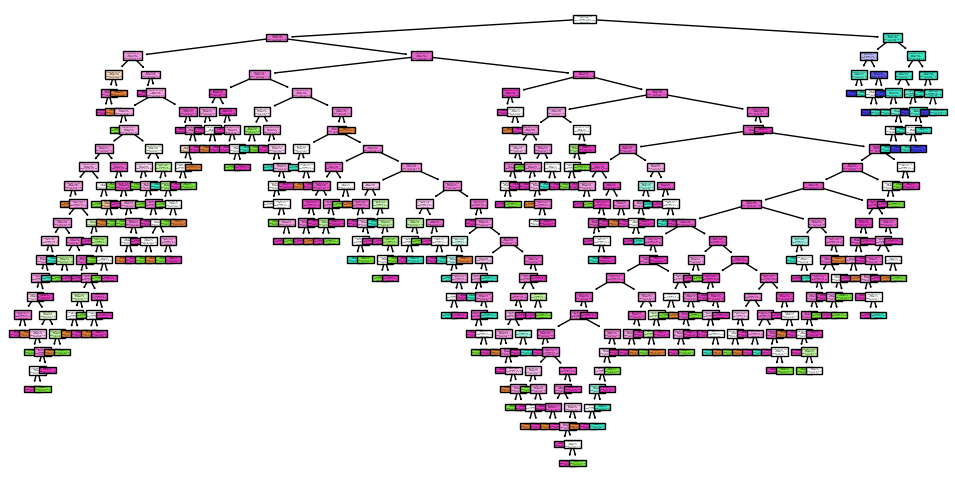

In [15]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plot_tree(clf, filled=True, feature_names=X.columns, class_names=df['weather'].unique())
plt.show()

In [17]:
df = pd.read_csv('seattle-weather.csv')

In [18]:
#SPITTING DATA INTO TRAIN TEST (80-20)
X=df[['precipitation','temp_max','temp_min','wind']]
Y=df['weather_enc']


KeyError: 'weather_enc'

In [285]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=42)


In [286]:
print(X_train.shape,Y_train.shape,X_test.shape,Y_test.shape)

(1168, 4) (1168,) (293, 4) (293,)


In [287]:
from sklearn.linear_model import LogisticRegression #sigmoid activation function
import warnings
warnings.filterwarnings('ignore')

In [288]:
model = LogisticRegression(multi_class='multinomial',solver='lbfgs')   # multiclass having solver = 'idfgs' always

In [289]:
X_train

,precipitation,temp_max,temp_min,wind
1066,0.0,5.6,-3.2,5.7
638,18.5,13.9,10.0,6.3
799,18.8,12.2,6.1,2.2
380,0.0,6.7,-0.6,2.3
303,34.5,15.0,12.2,2.8
...,...,...,...,...
1130,8.4,10.6,4.4,1.7
1294,0.0,33.3,17.8,3.4
860,0.5,15.6,7.2,2.1
1459,0.0,5.6,-1.0,3.4


In [290]:
Y_train

1066    1
638     2
799     2
380     4
303     2
       ..
1130    2
1294    4
860     2
1459    4
1126    1
Name: weather_enc, Length: 1168, dtype: int64

In [291]:
# training model

model.fit(X_train,Y_train)

LogisticRegression(multi_class='multinomial')

In [292]:
Y_pred = model.predict(X_test)

In [293]:
pd.DataFrame(Y_pred).value_counts()

4    173
2    119
3      1
dtype: int64

In [294]:
Y_test.value_counts()

4    131
2    120
1     25
0      9
3      8
Name: weather_enc, dtype: int64

In [295]:
model.predict_proba(X_test)

array([[4.79369034e-02, 8.36535845e-02, 4.21868037e-02, 3.49771312e-07,
        8.26222359e-01],
       [1.86649399e-14, 1.17906418e-15, 9.89774905e-01, 1.02250950e-02,
        6.95727335e-23],
       [6.02341134e-02, 1.35455229e-01, 1.72972840e-01, 1.81471302e-03,
        6.29523105e-01],
       ...,
       [9.40400916e-02, 1.42047836e-01, 1.02850396e-01, 6.08505491e-05,
        6.61000825e-01],
       [5.23466511e-05, 8.96193979e-05, 9.95209268e-01, 4.63878636e-03,
        9.97941234e-06],
       [3.05329109e-02, 7.21948054e-02, 5.17908896e-02, 4.09598133e-06,
        8.45477298e-01]])

In [296]:
#Perfomence Matrix

from sklearn.metrics import confusion_matrix,accuracy_score,classification_report

* drizzle ->  0
* fog     ->  1
* rain    ->  2
* snow    ->  3
* sun     ->  4

In [297]:
print(confusion_matrix(Y_pred,Y_test))

[[  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   0 112   7   0]
 [  0   0   0   1   0]
 [  9  25   8   0 131]]


In [298]:
print(accuracy_score(Y_pred,Y_test))

0.8327645051194539


In [299]:
print(classification_report(Y_pred,Y_test))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.00      0.00      0.00         0
           2       0.93      0.94      0.94       119
           3       0.12      1.00      0.22         1
           4       1.00      0.76      0.86       173

    accuracy                           0.83       293
   macro avg       0.41      0.54      0.40       293
weighted avg       0.97      0.83      0.89       293



In [300]:
from sklearn.feature_selection import VarianceThreshold
#To remove constant or near constant features
constant_filter = VarianceThreshold(threshold=0)
constant_filter.fit(X_train)
len(X_train.columns[constant_filter.get_support()])

4

In [301]:
#Find constant columns
constant_columns = [column for column in X_train.columns
                    if column not in X_train.columns[constant_filter.get_support()]]
print(len(constant_columns))

0


In [302]:
from sklearn.feature_selection import VarianceThreshold
sel=VarianceThreshold(threshold=0.6)
sel.fit(X_train)

VarianceThreshold(threshold=0.6)

In [303]:
sel.variances_

array([46.02314692, 53.24687013, 24.9548582 ,  2.04006849])

In [304]:
# We will be considering - precipitation  ,temp_max  , wind features
x_train=X_train.drop('wind',axis=1,inplace=True)
x_test=X_test.drop('wind',axis=1,inplace=True)

In [19]:
X = df[['precipitation', 'temp_max', 'temp_min', 'wind']]
y = df['weather']  # Replace 'weather_condition' with your actual target column name


In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [22]:
from sklearn.linear_model import LogisticRegression #sigmoid activation function
import warnings
warnings.filterwarnings('ignore')

In [23]:
clf = LogisticRegression(max_iter=1000)  # You can adjust the max_iter as needed
clf.fit(X_train, y_train)


LogisticRegression(max_iter=1000)

In [24]:
y_pred = clf.predict(X_test)


In [25]:
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{class_report}")


Accuracy: 0.8327645051194539
Confusion Matrix:
[[  0   0   0   0   9]
 [  0   0   0   0  25]
 [  0   0 112   0   8]
 [  0   0   7   1   0]
 [  0   0   0   0 131]]
Classification Report:
              precision    recall  f1-score   support

     drizzle       0.00      0.00      0.00         9
         fog       0.00      0.00      0.00        25
        rain       0.94      0.93      0.94       120
        snow       1.00      0.12      0.22         8
         sun       0.76      1.00      0.86       131

    accuracy                           0.83       293
   macro avg       0.54      0.41      0.40       293
weighted avg       0.75      0.83      0.78       293



In [27]:
y_train

1066     fog
638     rain
799     rain
380      sun
303     rain
        ... 
1130    rain
1294     sun
860     rain
1459     sun
1126     fog
Name: weather, Length: 1168, dtype: object

In [28]:
df

,date,precipitation,temp_max,temp_min,wind,weather
0,2012-01-01,0.0,12.8,5.0,4.7,drizzle
1,2012-01-02,10.9,10.6,2.8,4.5,rain
2,2012-01-03,0.8,11.7,7.2,2.3,rain
3,2012-01-04,20.3,12.2,5.6,4.7,rain
4,2012-01-05,1.3,8.9,2.8,6.1,rain
...,...,...,...,...,...,...
1456,2015-12-27,8.6,4.4,1.7,2.9,rain
1457,2015-12-28,1.5,5.0,1.7,1.3,rain
1458,2015-12-29,0.0,7.2,0.6,2.6,fog
1459,2015-12-30,0.0,5.6,-1.0,3.4,sun


In [29]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report


In [31]:
# Assuming 'date', 'precipitation', 'temp_max', 'temp_min', 'wind' are your features,
# and 'weather' is your target column.
X = df[['precipitation', 'temp_max', 'temp_min', 'wind']]
y = df['weather']


In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [33]:
# Initialize the Random Forest Classifier (you can adjust hyperparameters)
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the model to the training data
rf_classifier.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

In [34]:
y_pred = rf_classifier.predict(X_test)


In [35]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.8156996587030717


In [36]:
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


In [37]:
# Assuming 'date', 'precipitation', 'temp_max', 'temp_min', 'wind' are your features,
# and 'weather' is your target column.
X = df[['precipitation', 'temp_max', 'temp_min', 'wind']]
y = df['weather']


In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [39]:
# Initialize the SVM Classifier (you can adjust hyperparameters)
svm_classifier = SVC(kernel='linear', C=1.0, random_state=42)

# Fit the model to the training data
svm_classifier.fit(X_train, y_train)


SVC(kernel='linear', random_state=42)

In [40]:
y_pred = svm_classifier.predict(X_test)


In [41]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.8293515358361775


In [42]:
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


In [43]:
# Assuming 'date', 'precipitation', 'temp_max', 'temp_min', 'wind' are your features,
# and 'weather' is your target column.
X = df[['precipitation', 'temp_max', 'temp_min', 'wind']]
y = df['weather']


In [44]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [45]:
# Initialize the KNN Classifier (you can adjust hyperparameters, e.g., n_neighbors)
knn_classifier = KNeighborsClassifier(n_neighbors=5)  # You can choose an appropriate value for k
knn_classifier.fit(X_train, y_train)


KNeighborsClassifier()

In [46]:
y_pred = knn_classifier.predict(X_test)


In [47]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.7815699658703071
